In [701]:
from spinncer.analysis_common import *
%matplotlib inline
import traceback
from matplotlib.ticker import FixedLocator

In [937]:
path_to_results = "/localhome/mbax3pb2/SpiNNCer/tests/01_ms_tests/results/" 
baseline = None
file = None

# -------------BASELINE--------------------
### NEST
baseline = "SPIKES_REAL_FAN_INS_testing_all_cells_nest_r_mem_False.npz"  # MULTI SPIKES WITH REALISTIC FAN INS
# baseline = "SPIKES_testing_all_cells_nest_r_mem_False.npz"        # MULTI SPIKES
# baseline = "SINGLE_SPIKE_testing_all_cells_nest_r_mem_False.npz"  # SINGLE SPIKE
#### NEST

# baseline = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_True.npz" # SINGLE SPIKE

# ____________ COMPARE TO SPINNAKER _________
# baseline = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_False.npz"
# baseline = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_False_RD_S1615.npz" #  MULTI SPIKES WITH REALISTIC FAN INS

# -------------   FILE --------------------
# ------- Vanilla -------
file = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_False.npz" # MULTI SPIKES WITH REALISTIC FAN INS
# file = "SPIKES_testing_all_cells_spinnaker_r_mem_False.npz"       # MULTI SPIKES
# file = "SINGLE_SPIKE_testing_all_cells_spinnaker_r_mem_False.npz" # SINGLE SPIKE
# file = "SINGLE_SPIKE_testing_all_cells_spinnaker_r_mem_False_RTN.npz" # SINGLE SPIKE
# file = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_False_RTN.npz" #  MULTI SPIKES WITH REALISTIC FAN INS
# file = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_False_RD_S1615.npz" #  MULTI SPIKES WITH REALISTIC FAN INS


# file = "SINGLE_SPIKE_testing_all_cells_spinnaker_r_mem_False_RD_volatile.npz" # SINGLE SPIKE


# file = "SINGLE_SPIKE_testing_all_cells_spinnaker_r_mem_False_RD_S1615.npz" # SINGLE SPIKE

# ------- R MEM -------

# file = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_True.npz" # MULTI SPIKES WITH REALISTIC FAN INS
# file = "SPIKES_testing_all_cells_spinnaker_r_mem_True.npz"       # MULTI SPIKES
# file = "SINGLE_SPIKE_testing_all_cells_spinnaker_r_mem_True.npz" # SINGLE SPIKE

# file = "SPIKES_REAL_FAN_INS_testing_all_cells_spinnaker_r_mem_True_UFRACT_broken_for_other_cases.npz"

DEFAULT_FIGURE_DIR = 'figures/'
DEFAULT_RESULT_DIR = 'results/'

file_path = os.path.join(path_to_results,file)
baseline_path = os.path.join(path_to_results,baseline)

fig_folder = DEFAULT_FIGURE_DIR
worst_case = True
delay_sensitive=True
dark_background=False
highlight_stim=True
timestep=0.1*ms

In [938]:
# Baseline values
baseline_data = np.load(baseline_path, allow_pickle=True)
baseline_spikes=baseline_data['spikes'].ravel()[0]
baseline_vs=baseline_data['v'].ravel()[0]
baseline_gsyn_excs=baseline_data['gsyn_exc'].ravel()[0]
baseline_gsyn_inhs=baseline_data['gsyn_inh'].ravel()[0]
# Experiment parameters
baseline_simtime=baseline_data['simtime']
baseline_input_spikes=baseline_data['input_spikes'].ravel()[0]
baseline_subcycles=baseline_data['subcycles']
baseline_cases=baseline_data['cases']

In [939]:
# Baseline values
data = np.load(file_path, allow_pickle=True)
spikes=data['spikes'].ravel()[0]
vs=data['v'].ravel()[0]
gsyn_excs=data['gsyn_exc'].ravel()[0]
gsyn_inhs=data['gsyn_inh'].ravel()[0]
# Experiment parameters
simtime=data['simtime']
input_spikes=data['input_spikes'].ravel()[0]
subcycles=data['subcycles']
cases=data['cases']
case_names=data['case_names']

In [940]:
empirical_rates={}

for case, pop_spikes in input_spikes.items():
    print(case_names[case], case)
    empirical_rates[case] = {k:0 for k in pop_spikes.keys()}
    for pop_name, pop_spike in pop_spikes.items():            
        for spiketrain in pop_spike:
            if type(spiketrain) == float:
                empirical_rates[case][pop_name] += 1
            else:
                empirical_rates[case][pop_name] += len(spiketrain)
            


LOW 0
HIGH 1


In [941]:
empirical_rates

{0: {'aa_goc': 8165,
  'gj_bc': 3432,
  'gj_sc': 3635,
  'glom_grc': 34,
  'goc_grc': 737,
  'pc_dcn': 14359},
 1: {'aa_goc': 357632,
  'gj_bc': 22998,
  'gj_sc': 24332,
  'glom_grc': 5604,
  'goc_grc': 5349,
  'pc_dcn': 114434}}

In [942]:
simtime * ms

10. * second

In [943]:
# assert np.all(baseline_dc_currents==dc_currents)
assert simtime == baseline_simtime
assert np.all(cases == baseline_cases)

In [944]:
plot_order = get_plot_order(spikes[1][0].keys())
# Pre-compute conversions
time_to_bin_conversion = 1. / (timestep / ms)
bins_in_3ms = int(3 * time_to_bin_conversion)
no_timesteps = int(simtime / ms * time_to_bin_conversion)
pad_to_compute_3ms_bins = bins_in_3ms - no_timesteps % bins_in_3ms

In [945]:
def compute_spikes_per_timestep(all_spikes, plot_order):
    spikes_per_timestep = {}

    for pop in plot_order:
        spikes = all_spikes[pop]

        spikes_per_timestep[pop] = \
            np.bincount((spikes[:, 1] * time_to_bin_conversion).astype(int),
                        minlength=no_timesteps)
    return spikes_per_timestep

In [946]:
# https://stackoverflow.com/questions/56654952/how-to-mark-cells-in-matplotlib-pyplot-imshow-drawing-cell-borders
def highlight_cell(x,y, ax=None, **kwargs):
    rect = plt.Rectangle((x, y), 1,1, fill=False, **kwargs)
    ax = ax or plt.gca()
    ax.add_patch(rect)
    return rect

def highlight_column(x,y, height, ax=None, **kwargs):
    rect = plt.Rectangle((x, y), 1, height, fill=False, **kwargs)
    ax = ax or plt.gca()
    ax.add_patch(rect)
    return rect

def closest_ioffset_index(value, dc_currents):
    diffs = dc_currents - value
    argmin = np.argmin(np.abs(diffs))
    return argmin

def count_spikes_per_neuron(spikes):
    nids = np.unique(spikes[:, 0]).astype(int)   
    if len(nids)==0:
        spike_counts = np.zeros(1)
    else:
        spike_counts = np.zeros(np.max(nids)+1)
    for n in nids:
        spike_counts[n] = spikes[spikes[:, 0]==n].size
    return spike_counts

def compute_lead_or_lag_per_neuron(spikes_1, spikes_2, nth_spike):
    nids = np.unique(spikes_1[:, 0]).astype(int)
    if len(nids)==0:
        spike_lead_lag = np.zeros(1)
    else:
        spike_lead_lag = np.zeros(np.max(nids)+1)
    for n in nids:
        filtered_spikes_1 = np.sort(spikes_1[spikes_1[:, 0]==n][:, 1])
        filtered_spikes_2 = np.sort(spikes_2[spikes_2[:, 0]==n][:, 1])
        if filtered_spikes_1.size < nth_spike or filtered_spikes_2.size < nth_spike:
            spike_lead_lag[n] = np.nan
        else:
            spike_lead_lag[n] = filtered_spikes_1[nth_spike-1] - filtered_spikes_2[nth_spike-1]
    return spike_lead_lag

def plot_imshow_diff_map(diff_map, plot_order, dc_currents, subcycles, xlabel, cmap_label, fig_name, fig_folder, vmax=None, vmin=None, rotation=90):
    camera_ready_dc = ["{}".format(x) for x in case_names]
    camera_ready_pops = [use_display_name(x) for x in plot_order]
    n_pops = len(plot_order)
    n_sc = len(subcycles)
    n_dc = len(dc_currents)
    
    f = plt.figure(1, figsize=(7, 7), dpi=500)
    im = plt.imshow(diff_map[:, dc_currents], interpolation='none', vmax=vmax, vmin=vmin,
                    extent=[0, dc_currents.size, (n_sc) * n_pops, 0],
                    origin='upper')
    ax = plt.gca()
    ax.set_aspect('auto')
    plt.xlabel(xlabel)
    plt.ylabel("Population")

    plt.xticks(np.arange(dc_currents.size) + .5, camera_ready_dc)
    plt.yticks(np.arange(len(camera_ready_pops))*n_sc + (n_sc/2.) - .5, camera_ready_pops, rotation=rotation, va='center')
    ax.yaxis.set_minor_locator(FixedLocator(np.arange(len(camera_ready_pops))*n_sc))
    ax.xaxis.set_minor_locator(FixedLocator(np.arange(len(dc_currents))))
    
    plt.grid(b=True, which='minor', color='k', linestyle='-', linewidth=1)
#     for p_id, po in enumerate(plot_order):
#         closest = closest_used_dc_current[po]
#         highlight_column(closest, p_id * n_sc, n_sc, color="white", linewidth=1, zorder=4)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", "5%", pad="3%")
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label(cmap_label)

    save_figure(plt, os.path.join(fig_folder,
                          fig_name),
                extensions=['.png', '.pdf'])
    plt.show()
    plt.close(f)
    
    
def plot_raster_and_psth(all_spikes, plot_order, suffix=None):
    n_plots = len(plot_order)
    spikes_per_timestep = compute_spikes_per_timestep(all_spikes, plot_order)
    print("Plotting spiking raster plot + PSTH for all populations")
    f, axes = plt.subplots(2 * len(all_spikes.keys()), 1,
                           figsize=(20, 30), sharex=True, dpi=300)
    for index, pop in enumerate(np.repeat(plot_order, 2)):
        curr_ax = axes[index]
        if index % 2 == 0:
            # spike raster
            _times = all_spikes[pop][:, 1]
            _ids = all_spikes[pop][:, 0]
            curr_ax.scatter(_times,
                            _ids,
                            color=viridis_cmap(int(index / 2) / (n_plots + 1)),
                            s=.5, rasterized=True)
            curr_ax.set_title(use_display_name(pop))
            curr_ax.set_ylabel("NID")
        else:
            curr_ax.bar(np.arange(spikes_per_timestep[pop].size) * timestep / ms,
                        spikes_per_timestep[pop],
                        color=viridis_cmap(int(index / 2) / (n_plots + 1)),
                        rasterized=True)
            curr_ax.set_ylabel("Count")

    plt.xlabel("Time (ms)")
    # plt.suptitle((use_display_name(simulator) + "\n")
    f.tight_layout()
    plt.xlim([0, 500])
    file_out_name = "raster_and_psth_plots"
    if suffix is not None:
        file_out_name += "_" + suffix
    plt.show()
    save_figure(plt, file_out_name,
                extensions=['.png', ])
    plt.close(f)

In [947]:
# plot_raster_and_psth(spikes[1], plot_order)

In [948]:
# def plot_rate_diff(spikes, baseline_spikes, subcycles, dc_currents):

n_pops = len(plot_order)
n_sc = len(subcycles)
n_cases = len(cases)

diff_map = np.ones((n_pops*n_sc, n_cases)) * np.nan
spike_lead_lag_map_10th = np.ones((n_pops*n_sc, n_cases)) * np.nan
spike_lead_lag_map_100th = np.ones((n_pops*n_sc, n_cases)) * np.nan

spike_count_map_baseline = np.ones((n_pops*n_sc, n_cases)) * np.nan
spike_count_map = np.ones((n_pops*n_sc, n_cases)) * np.nan


for sc in subcycles:
    for case in cases:
        for index, pop in enumerate(plot_order):
            # y position should be dictated by population index and sc 
            comp_spike_count = count_spikes_per_neuron(spikes[sc][case][pop])
            baseline_spike_count = count_spikes_per_neuron(baseline_spikes[sc][case][pop])
            
            diff_map[index*n_sc + (sc-1), case] = comp_spike_count - baseline_spike_count   
            
            spike_count_map_baseline[index*n_sc + (sc-1), case] = baseline_spike_count
            spike_count_map[index*n_sc + (sc-1), case] = comp_spike_count
            
            spike_lead_lag_map_10th[index*n_sc + (sc-1), case] = compute_lead_or_lag_per_neuron(spikes[sc][case][pop], baseline_spikes[sc][case][pop], 10)
            spike_lead_lag_map_100th[index*n_sc + (sc-1), case] = compute_lead_or_lag_per_neuron(spikes[sc][case][pop], baseline_spikes[sc][case][pop], 100)
        
max_firing_rate = np.max((spike_count_map_baseline, spike_count_map)) / (simtime * ms)

In [949]:
print("Min diff", np.min(diff_map))
print("Max diff", np.max(diff_map))
print("Max firing rate", max_firing_rate)

Min diff -4.0
Max diff 856.0
Max firing rate 1.9836 kHz


In [950]:
camera_ready_dc = ["LOW", "HIGH"]
camera_ready_pops = [use_display_name(x) for x in plot_order]

# What is the difference in spike counts (time is 1 second, so equivalent to firing rates) between SpiNNaker and NEST?

The values are computed for each neuron and subcycle pair as $F_{SpiNNaker}-F_{NEST}$. The results below show that SpiNNaker either matches or produces more spikes than NEST; it never underestimates the number of spikes produced in any of the cases.

A single sub-cycle (default value for the solver) produces most accurate results in all cases here. Could this be a side effect of RD?

RD and RTN produce identical number of spikes. The question is now whether the differ in terms of lead/lag of spikes. 

After testing, they do not produce different lead or lag, so the results seem identical.

In [951]:
simtime * ms

10. * second

In [952]:
spike_count_map_baseline / (simtime * ms)

array([[2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [2.600e+00, 1.600e+00],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [3.028e+02, 9.510e+02],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [6.000e-01, 9.220e+01],
       [2.000e-01, 5.340e+01],
       [2.000e-01, 5.340e+01],
       [

In [953]:
spike_count_map / (simtime * ms)

array([[3.6000e+00, 3.3200e+01],
       [3.2000e+00, 2.6000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.2000e+00, 2.0000e+00],
       [3.0740e+02, 9.5240e+02],
       [3.0760e+02, 9.5620e+02],
       [3.0740e+02, 9.6200e+02],
       [3.0820e+02, 9.6240e+02],
       [3.0840e+02, 9.6340e+02],
       [3.0900e+02, 9.6400e+02],
       [3.0960e+02, 9.6420e+02],
       [3.1020e+02, 9.6460e+02],
       [3.1060e+02, 9.6480e+02],
       [3.1120e+02, 9.6480e+02],
       [6.0000e-01, 1.2940e+02],
       [6.0000e-01, 1.2700e+02],
       [6.0000e-01, 1.2680e+02],
       [6.0000e-01, 1.2680e+02],
       [6.0000e-01, 1.2700e+02],
       [4.0000e-01, 1.2680e+02],
       [4.0000e-01, 1.2680e+02],
       [2.0000e-01, 1.2680e+02],
       [2.0000e-01, 1.2760e+02],
       [2.0000e-01, 1.2820e+02],
       [0.

Plotting                                :figures/spikes_baseline_firing_rate_map.png
Plotting                                :figures/spikes_baseline_firing_rate_map.pdf


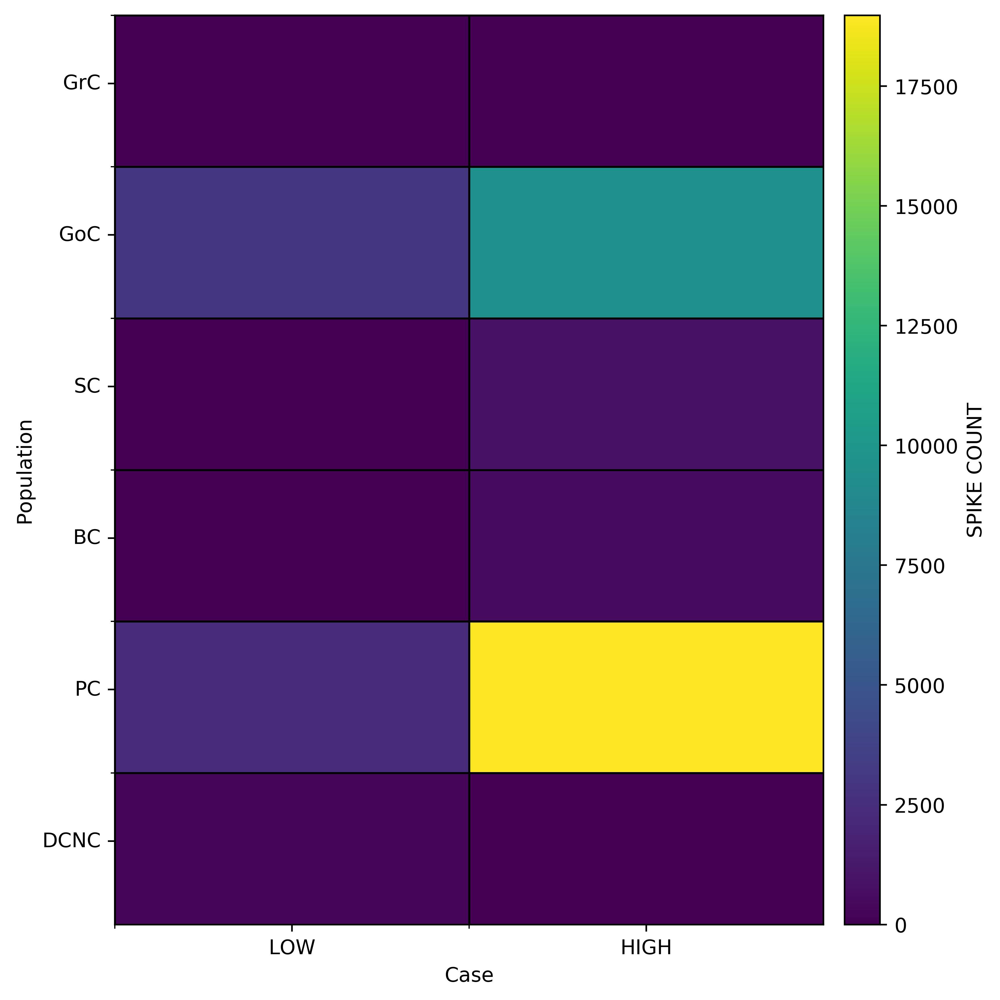

In [963]:
x = spike_count_map_baseline / (simtime * ms) 
plot_imshow_diff_map(spike_count_map_baseline, plot_order, cases, subcycles, "Case", "SPIKE COUNT", "spikes_baseline_firing_rate_map", 
                     fig_folder, 
#                      vmax=max_firing_rate, 
                     rotation=0)

Plotting                                :figures/spikes_firing_rate_map.png     
Plotting                                :figures/spikes_firing_rate_map.pdf     


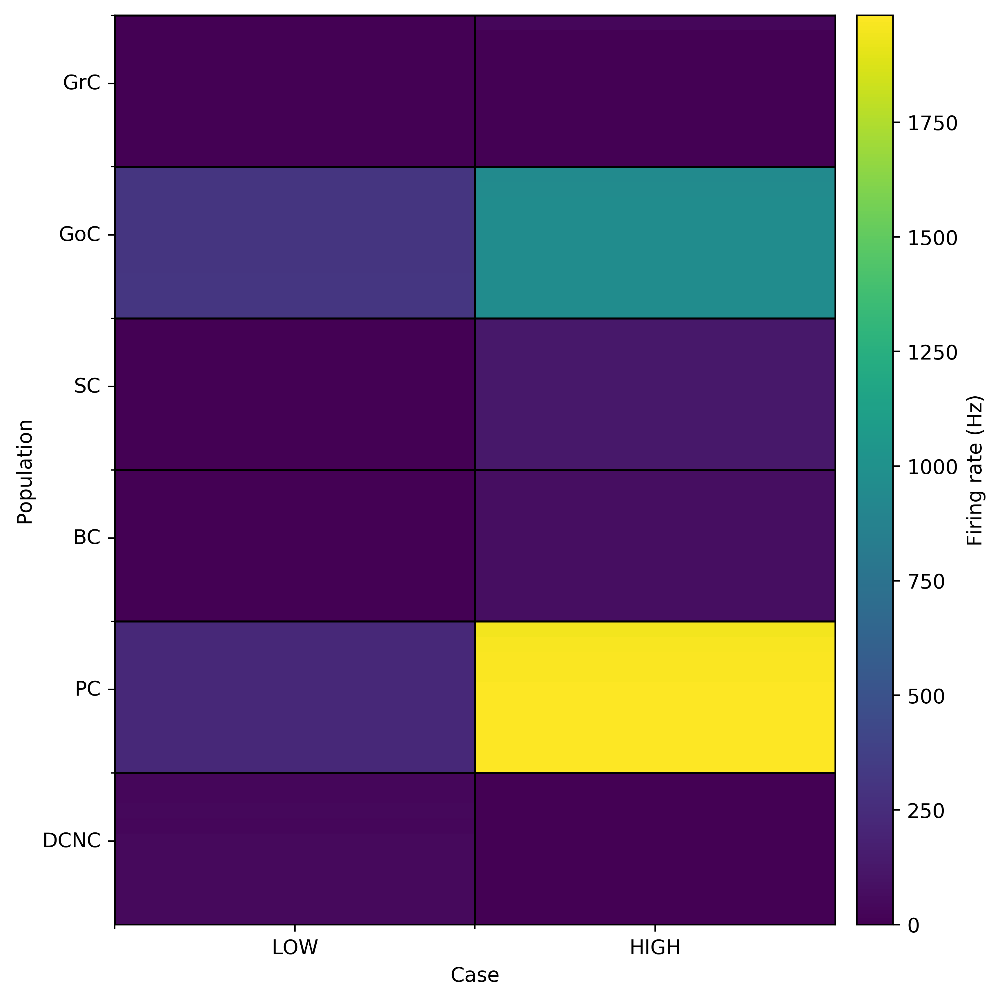

In [955]:
x2 = spike_count_map / (simtime * ms) 
plot_imshow_diff_map(x2/Hz, plot_order, cases, subcycles, "Case", "Firing rate (Hz)", "spikes_firing_rate_map", fig_folder, vmax=max_firing_rate, rotation=0)

Plotting                                :figures/spikes_count_difference.png    
Plotting                                :figures/spikes_count_difference.pdf    


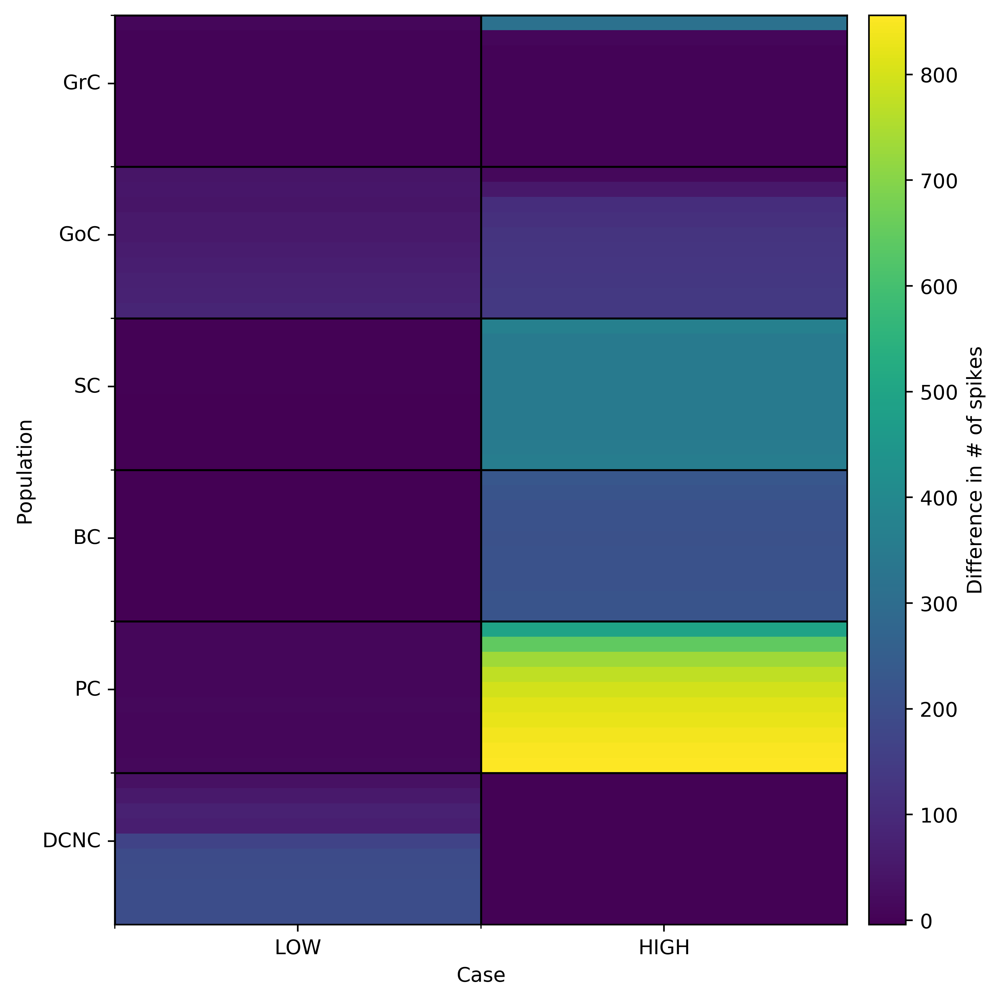

In [956]:
plot_imshow_diff_map(diff_map, plot_order, cases, subcycles, "Case", "Difference in # of spikes", "spikes_count_difference", fig_folder, rotation=0, 
#                      vmax=20, vmin=-20
                    )

In [957]:
spike_lead_lag_map_10th*ms

array([[-1.7861e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-1.7860e+03,         nan],
       [-3.0000e-01, -1.0000e-01],
       [-5.0000e-01, -2.0000e-01],
       [-4.0000e-01, -3.0000e-01],
       [-5.0000e-01, -3.0000e-01],
       [-5.0000e-01, -3.0000e-01],
       [-5.0000e-01, -3.0000e-01],
       [-6.0000e-01, -3.0000e-01],
       [-6.0000e-01, -3.0000e-01],
       [-6.0000e-01, -3.0000e-01],
       [-6.0000e-01, -3.0000e-01],
       [        nan, -2.6000e+01],
       [        nan, -1.5700e+01],
       [        nan, -1.5700e+01],
       [        nan, -1.5700e+01],
       [        nan, -1.5700e+01],
       [        nan, -1.5700e+01],
       [        nan, -1.5700e+01],
       [        nan, -1.5700e+01],
       [        nan,

Plotting                                :figures/spikes_10th_spike_lead_lag_map.png
Plotting                                :figures/spikes_10th_spike_lead_lag_map.pdf


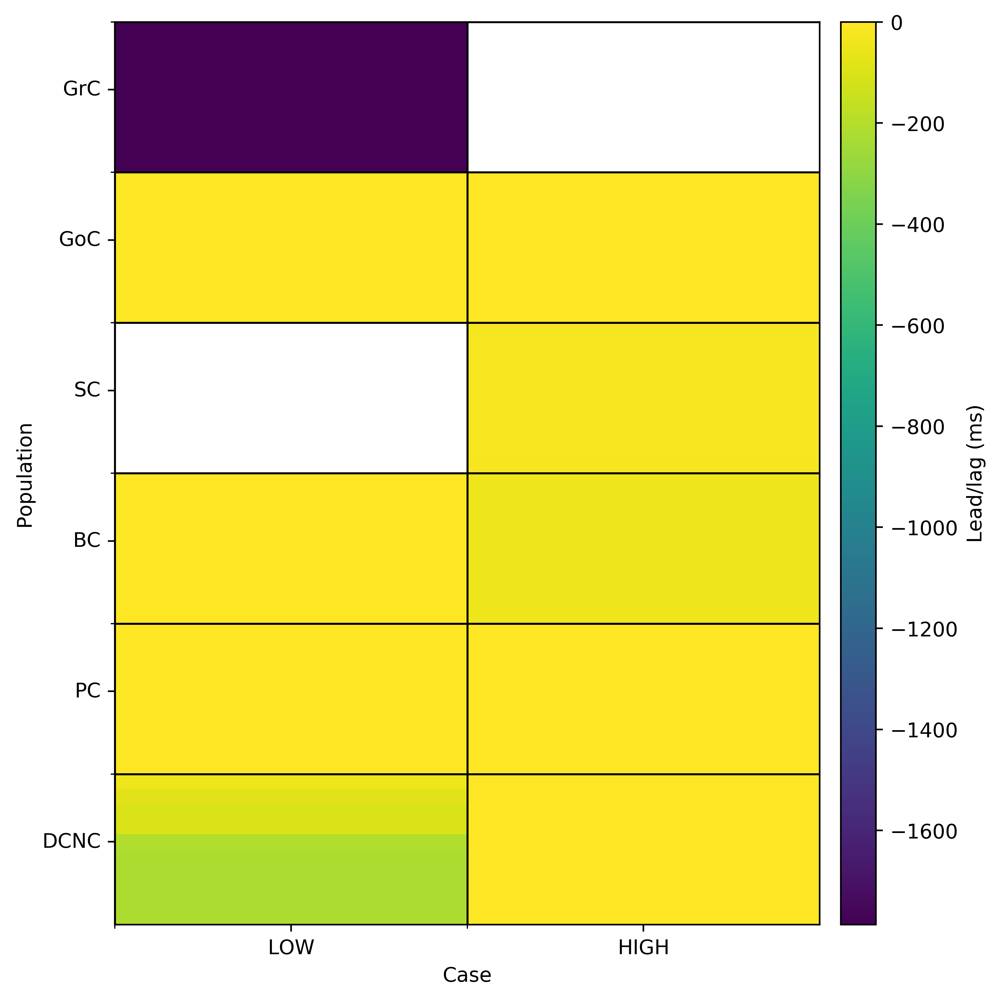

In [958]:
plot_imshow_diff_map(spike_lead_lag_map_10th, plot_order, 
#                      np.array([0, 1]),
                     cases, 
                     subcycles, "Case", "Lead/lag (ms)", "spikes_10th_spike_lead_lag_map", fig_folder, rotation=0, 
#                      vmax=.5, vmin=-.5
                    )

In [959]:
spike_lead_lag_map_100th * ms

array([[        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [        nan,         nan],
       [-2.1000e+00, -2.0000e-01],
       [-2.1000e+00, -1.2000e+00],
       [-2.1000e+00, -2.4000e+00],
       [-2.1000e+00, -2.4000e+00],
       [-2.1000e+00, -2.6000e+00],
       [-2.1000e+00, -2.7000e+00],
       [-2.1000e+00, -2.7000e+00],
       [-2.1000e+00, -2.7000e+00],
       [-2.1000e+00, -2.7000e+00],
       [-2.1000e+00, -2.8000e+00],
       [        nan, -6.2840e+02],
       [        nan, -5.8190e+02],
       [        nan, -5.8190e+02],
       [        nan, -5.8190e+02],
       [        nan, -5.8190e+02],
       [        nan, -5.8190e+02],
       [        nan, -5.8190e+02],
       [        nan, -5.8190e+02],
       [        nan,

Plotting                                :figures/spikes_100th_spike_lead_lag_map.png
Plotting                                :figures/spikes_100th_spike_lead_lag_map.pdf


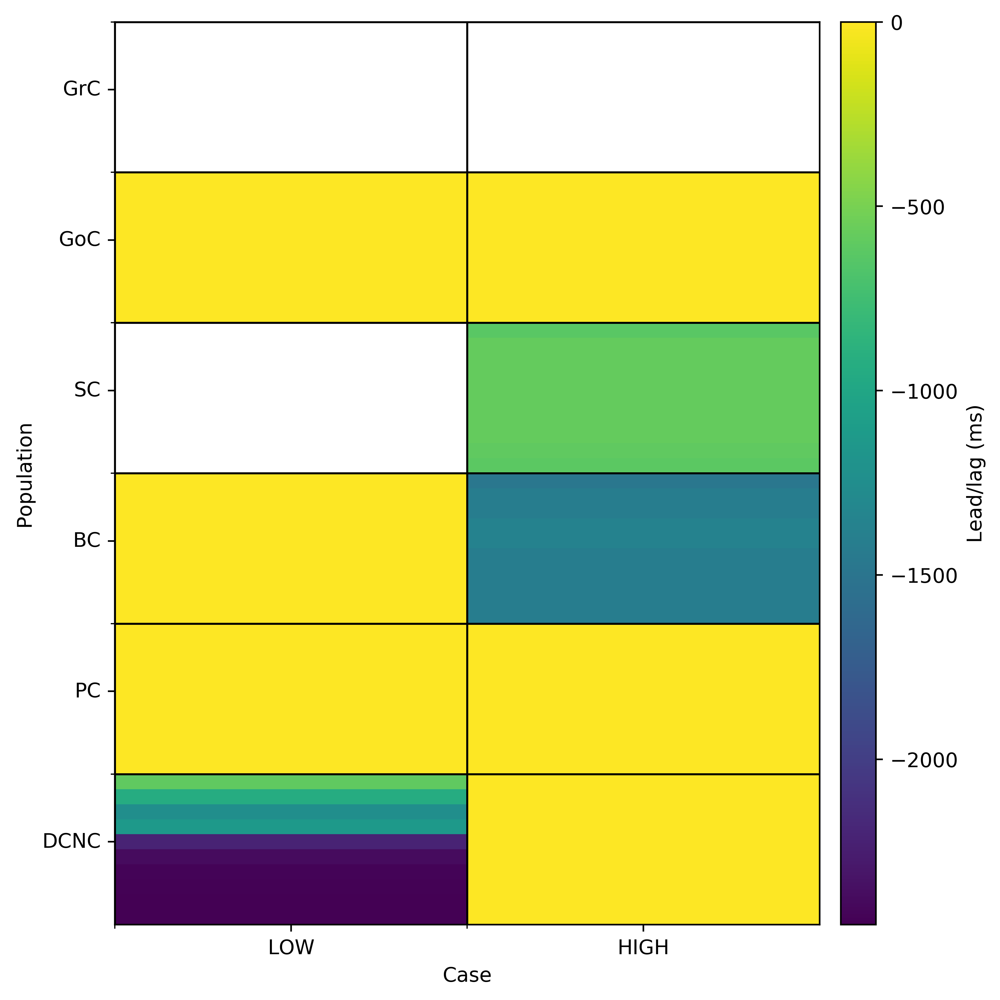

In [960]:
plot_imshow_diff_map(spike_lead_lag_map_100th, plot_order, 
#                      np.array([0, 1]), 
                     cases,                     
                     subcycles, "Case", "Lead/lag (ms)", "spikes_100th_spike_lead_lag_map", fig_folder, rotation=0, 
#                      vmax=5, vmin=-5
                    )

In [961]:
def plot_voltage(vs, baseline_vs, population, subcycles, dc_index, dc_currents, xlim=[0, 500], y_label="Membrane potential (mV)"):
    n_plots = len(subcycles)
    plt.figure(figsize=(8, 5), dpi=300)
    plt.title("{} {}".format(use_display_name(population), dc_currents[dc_index]))
    for index, sc in enumerate(subcycles):
        data = vs[sc][dc_index][population][0]
        plt.plot(np.arange(data.size)*0.1*ms, data, 
                            color=viridis_cmap(index / (n_plots + 1)),
                 label="{} sub-cycles".format(sc) if sc != 1 else "{} sub-cycle".format(sc), 
                 alpha=.8
                )
    baseline_data = baseline_vs[1][dc_index][population][0]
    plt.plot(np.arange(baseline_data.size)*0.1*ms, baseline_data, 
                            color="k",
                 label="Baseline",
                 linestyle=":",
                 alpha=.6
                )
    plt.ylabel(y_label)
    plt.xlabel("Time (s)")
    plt.xlim(xlim)
    plt.legend(loc='best')
    
def plot_assortment(pop, subcycles, case, case_names=case_names, xlim=[0, 500]):
    plot_voltage(vs, baseline_vs, population=pop, subcycles=subcycles, dc_index=case, dc_currents=case_names, xlim=xlim)
    plot_voltage(gsyn_excs, baseline_gsyn_excs, population=pop, subcycles=subcycles, dc_index=case, dc_currents=case_names, xlim=xlim, y_label="Exc syn conductance (nS)")
    plot_voltage(gsyn_inhs, baseline_gsyn_inhs, population=pop, subcycles=subcycles, dc_index=case, dc_currents=case_names, xlim=xlim, y_label="Inh syn conductance (nS)")
    
def plot_by_case(signal, baseline_signal, plot_order, subcycles, cases, y_label, xlim=[0, .1]):
    n_rows = len(plot_order)
    n_columns = len(cases)
    n_plots = len(subcycles)
    
    f, axes = plt.subplots(n_rows, n_columns, figsize=(6, 9), dpi=400, sharex='row', sharey='row')
    for index, pop in enumerate(plot_order):
        curr_axs = axes[index]
        
        curr_axs[0].set_ylabel(use_display_name(pop))
        for case_col, case in enumerate(cases):
            # Data stuff           
            for sc_index, sc in enumerate(subcycles):
                data = signal[sc][case][pop][0]
                curr_axs[case_col].plot(np.arange(data.size)*0.1*ms, data, 
                            color=viridis_cmap(sc_index / (n_plots + 1)),
                 label="{} sub-cycles".format(sc) if sc != 1 else "{} sub-cycle".format(sc), 
                 alpha=.8, rasterized=True, linewidth=.5
                )
                curr_axs[case_col].set_xlim(xlim)
                curr_axs[case_col].set_aspect('auto')
                
            baseline_data = baseline_signal[1][case][pop][0]
            curr_axs[case_col].plot(np.arange(baseline_data.size)*0.1*ms, baseline_data, 
                                    color="k",
                         label="Baseline",
                         linestyle=":",
                         alpha=.6, rasterized=True, linewidth=.5
                        )

            # admin stuff
            if index==0:
                curr_axs[case_col].set_title("{}".format(case_names[case]))
                if case_col==0:
                    curr_axs[0].legend(loc='best')
            if index==n_rows-1:
                curr_axs[case_col].set_xlabel("Time (s)")
                curr_axs[case_col].xaxis.set_visible(True)
    
#                 plt.xlabel("Time (s)")
            else:
                labels = [item.get_text() for item in curr_axs[case_col].get_xticklabels()]
                empty_string_labels = ['']*len(labels)
                curr_axs[case_col].set_xticklabels(empty_string_labels)
#     plt.subplots_adjust(wspace=-.1, hspace=0)
    save_figure(plt, "single_vs_max_spikes", extensions=['.png', '.pdf', ])
    plt.show()
    

Plotting                                :single_vs_max_spikes.png               
Plotting                                :single_vs_max_spikes.pdf               


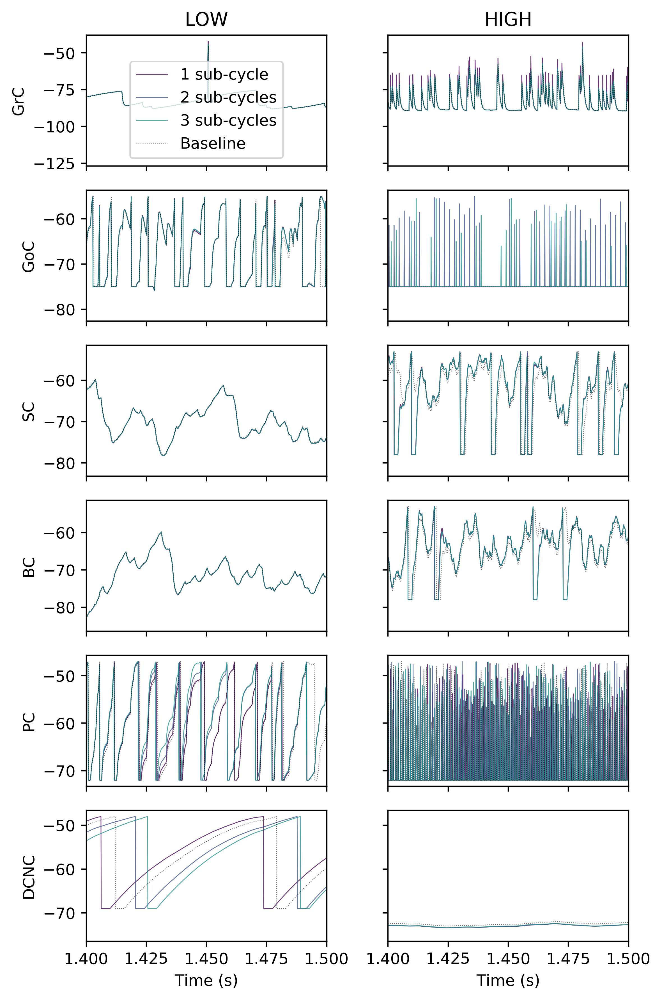

In [903]:
plot_by_case(vs, baseline_vs, plot_order, [1,2,3], cases=[0, 1], y_label="mV", xlim=[1.4, 1.5])

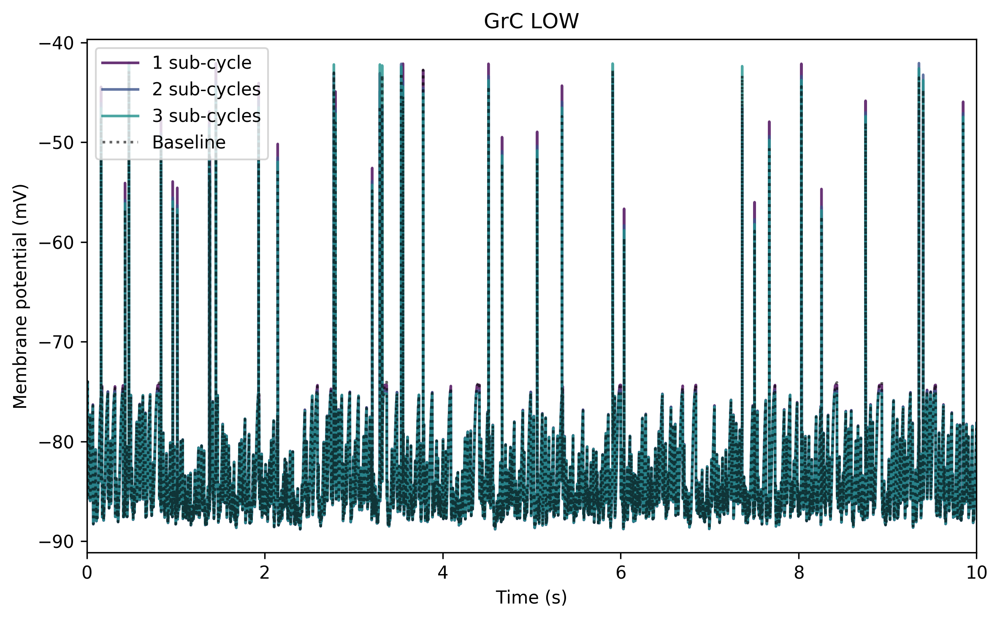

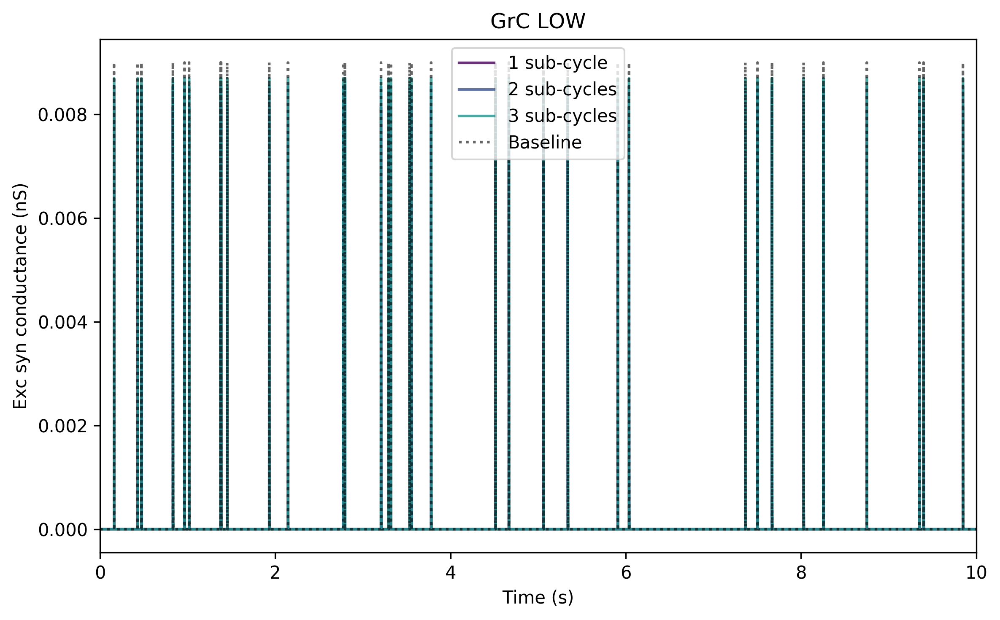

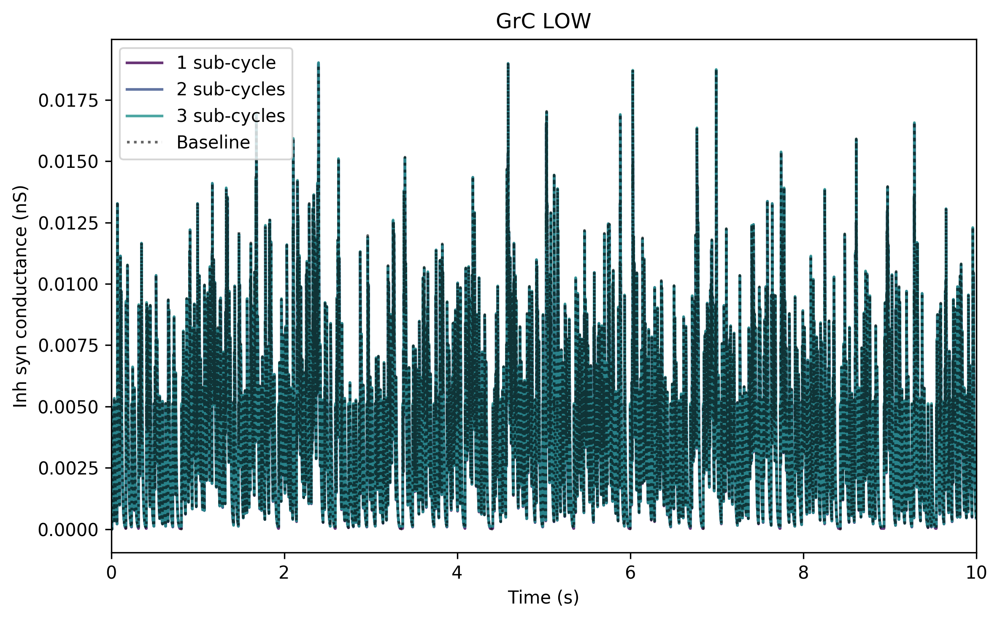

In [904]:
plot_assortment('granule', subcycles=[1,2,3], case=0, xlim=[0, 10])

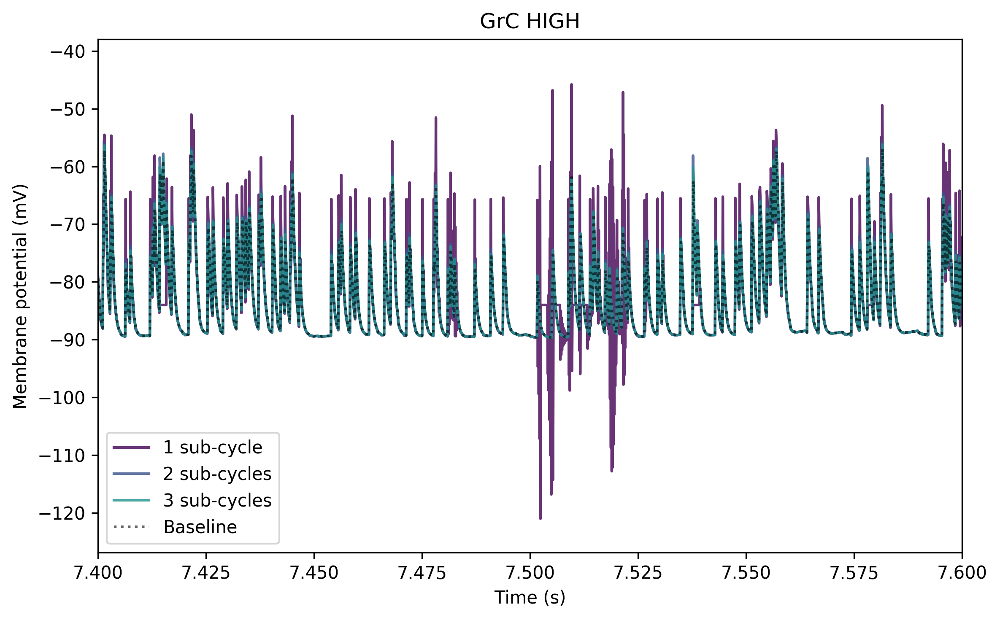

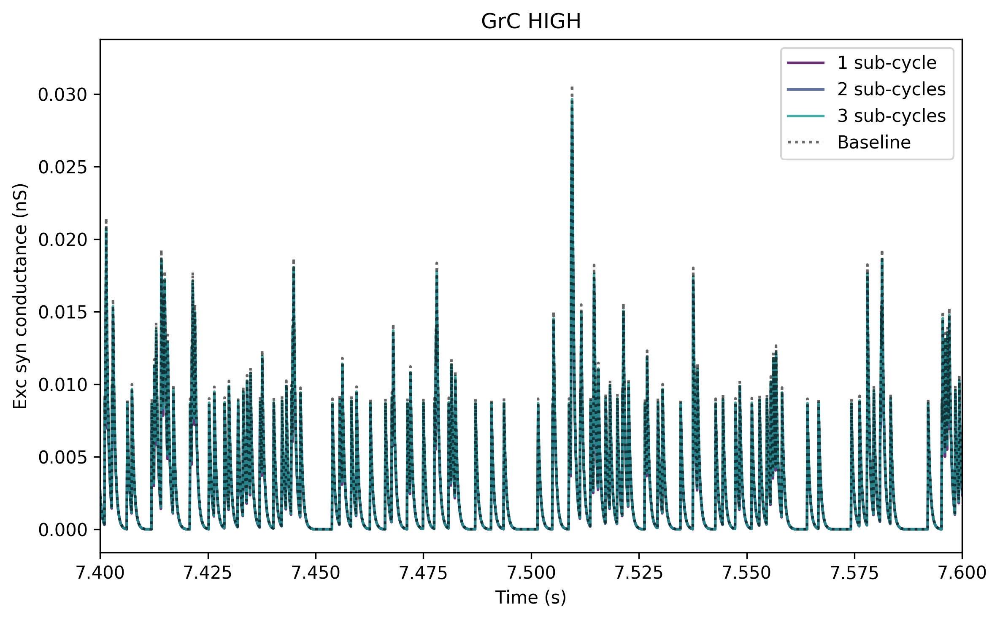

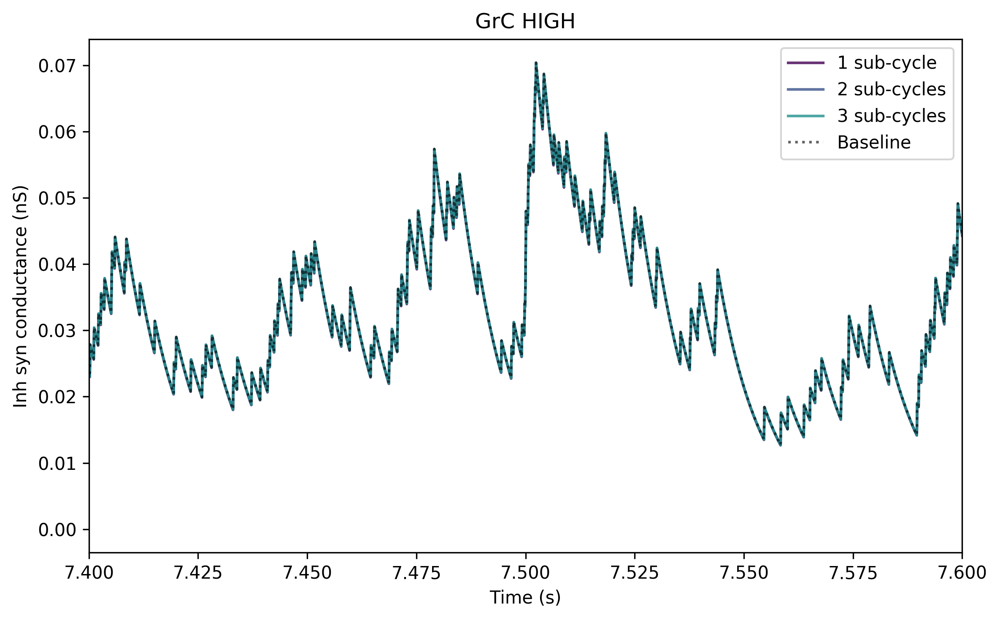

In [905]:

plot_assortment('granule', subcycles=[1,2,3], case=1, xlim=[7.4, 7.6])

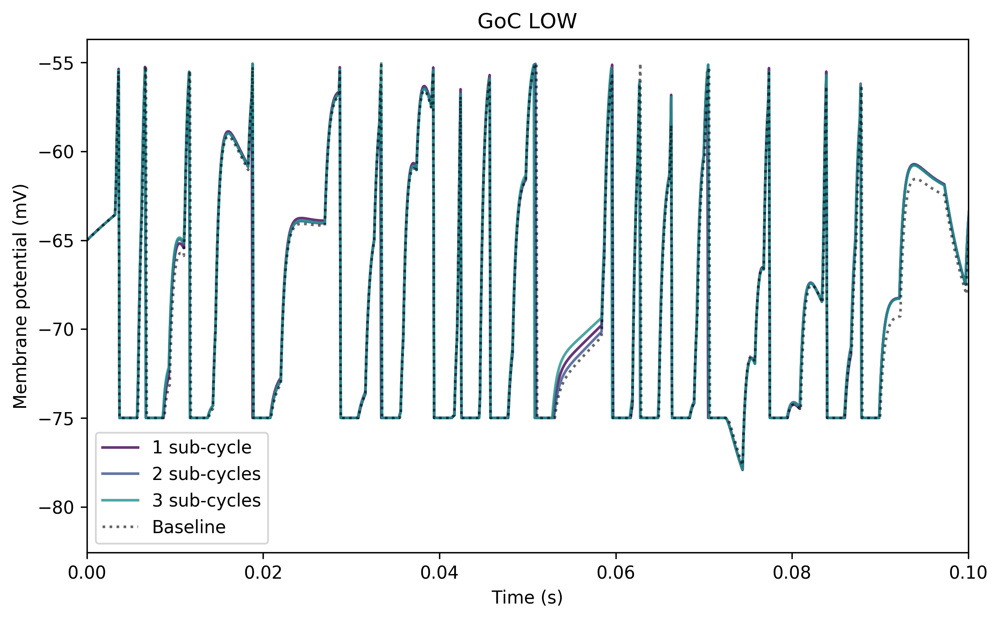

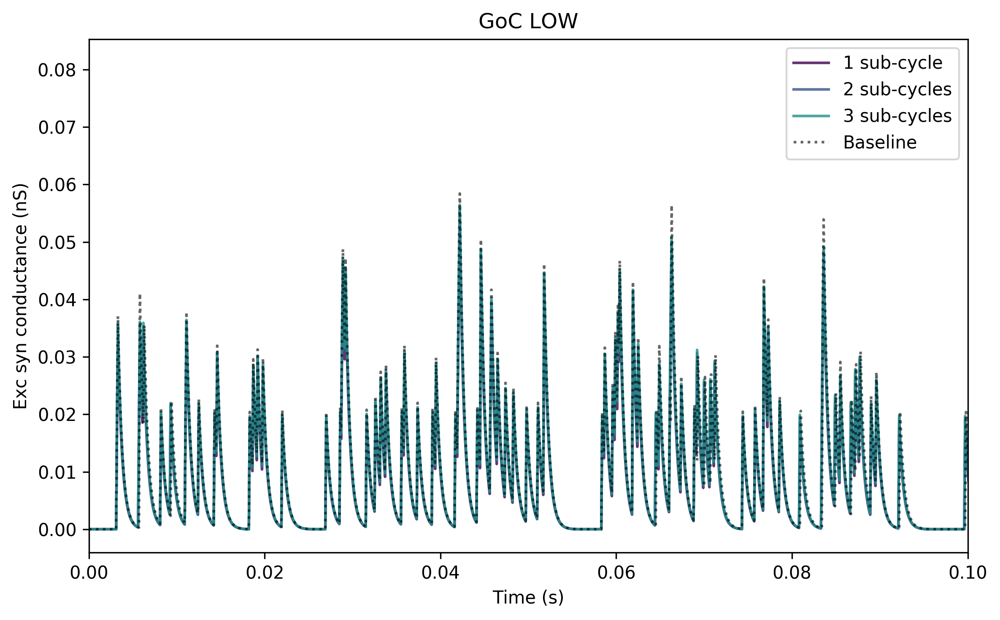

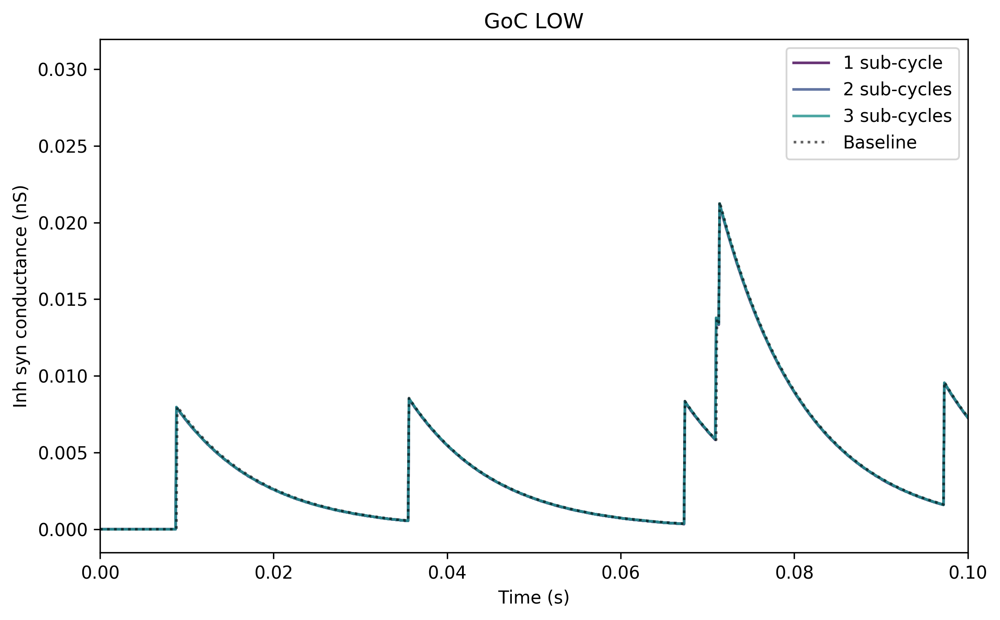

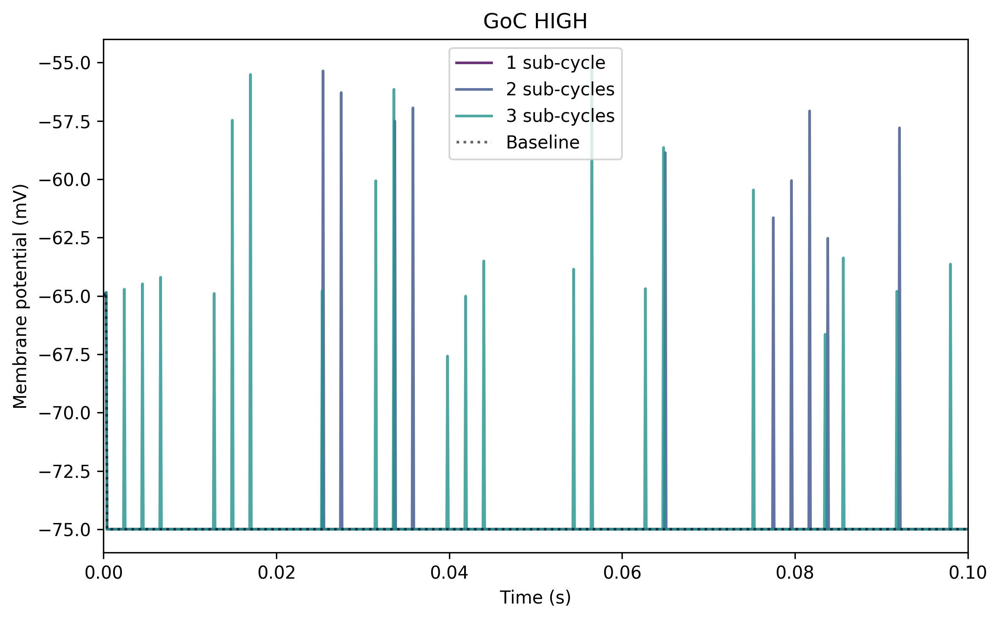

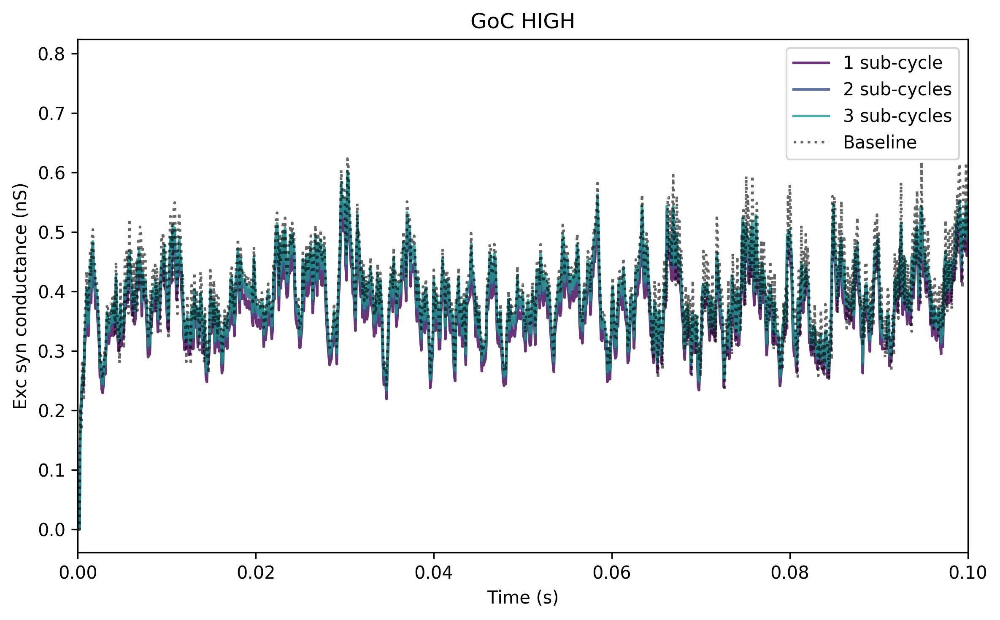

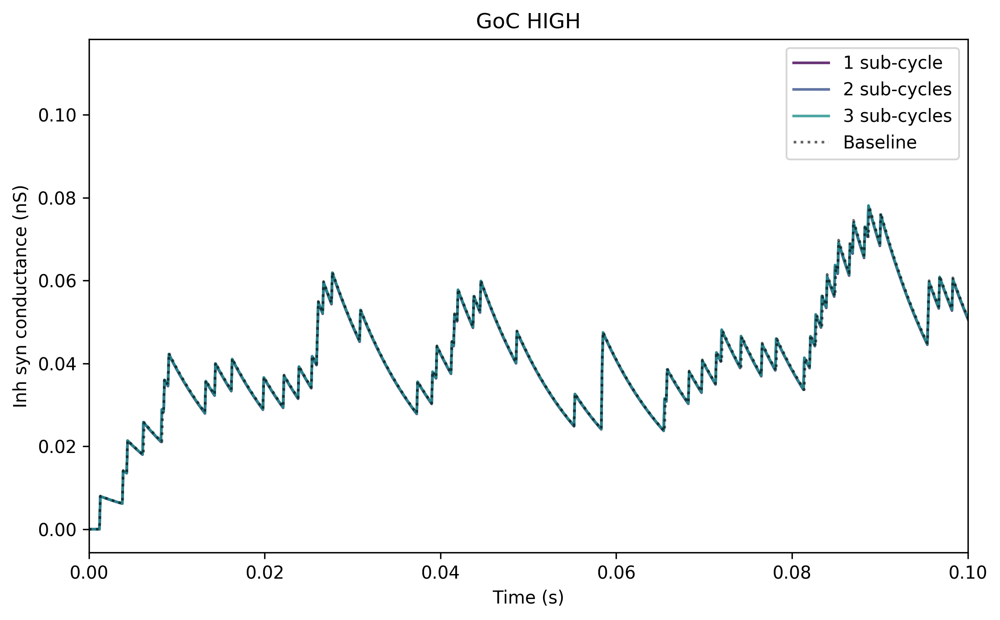

In [906]:
plot_assortment('golgi', subcycles=[1,2,3], case=0, xlim=[0, .1])
plot_assortment('golgi', subcycles=[1,2,3], case=1, xlim=[0, .1])

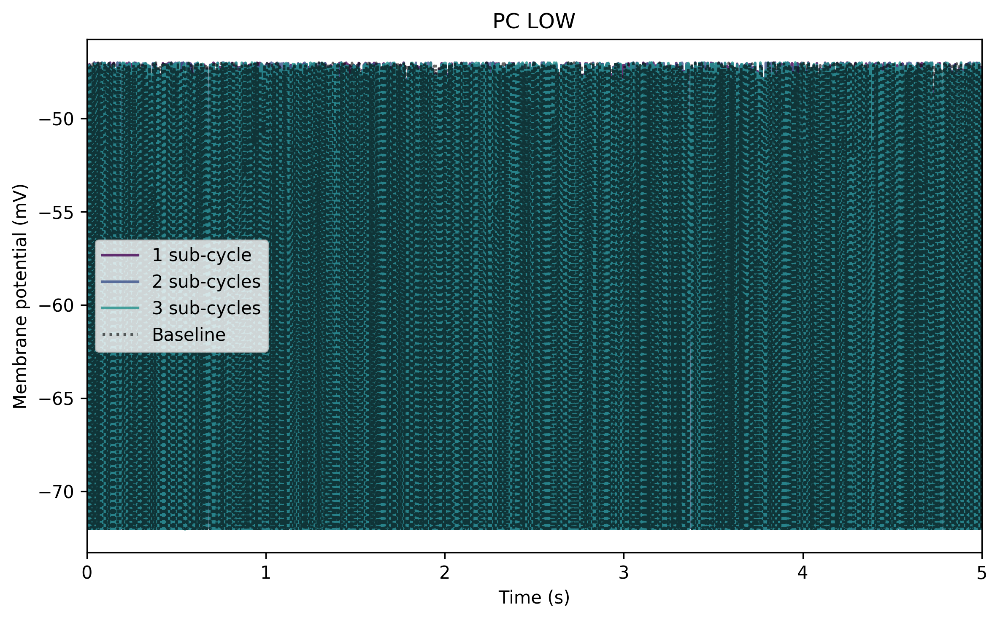

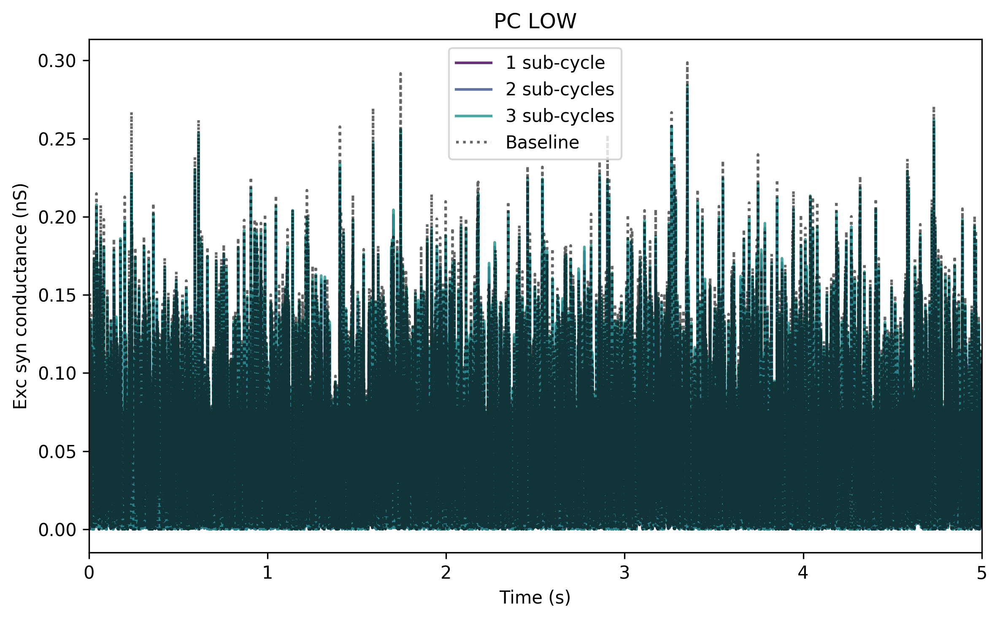

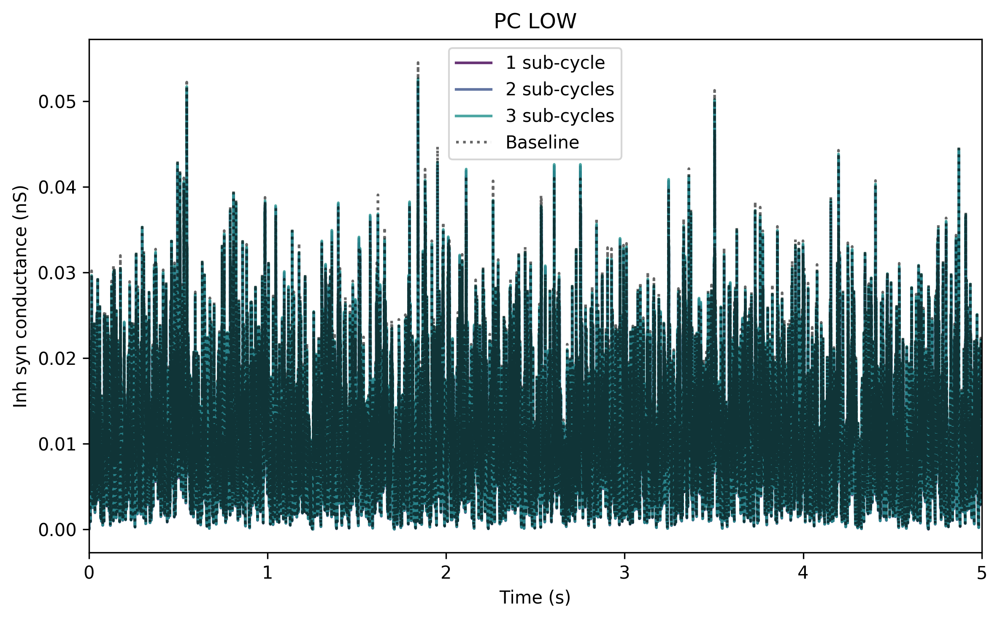

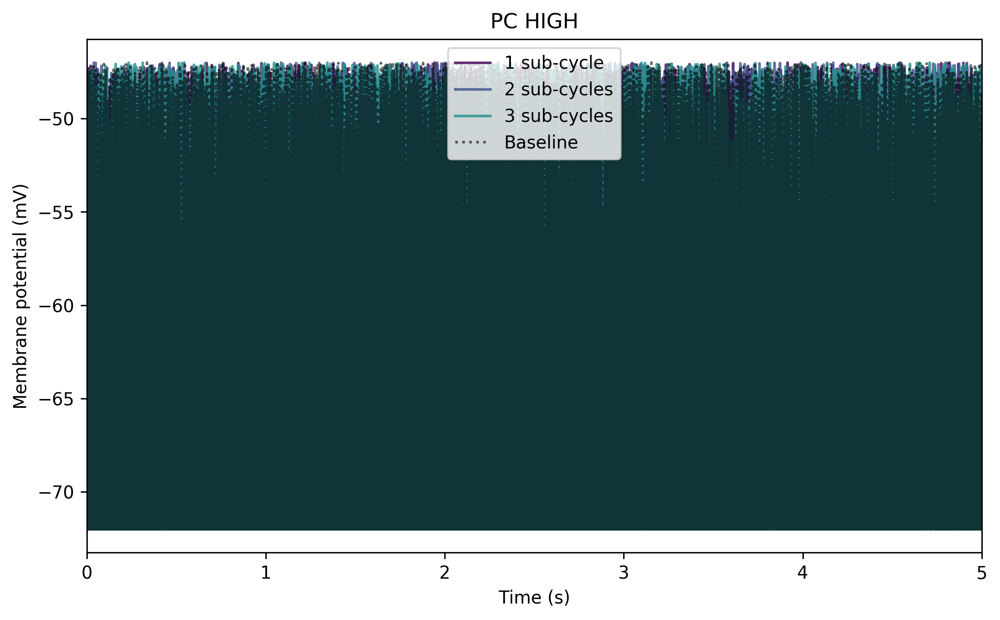

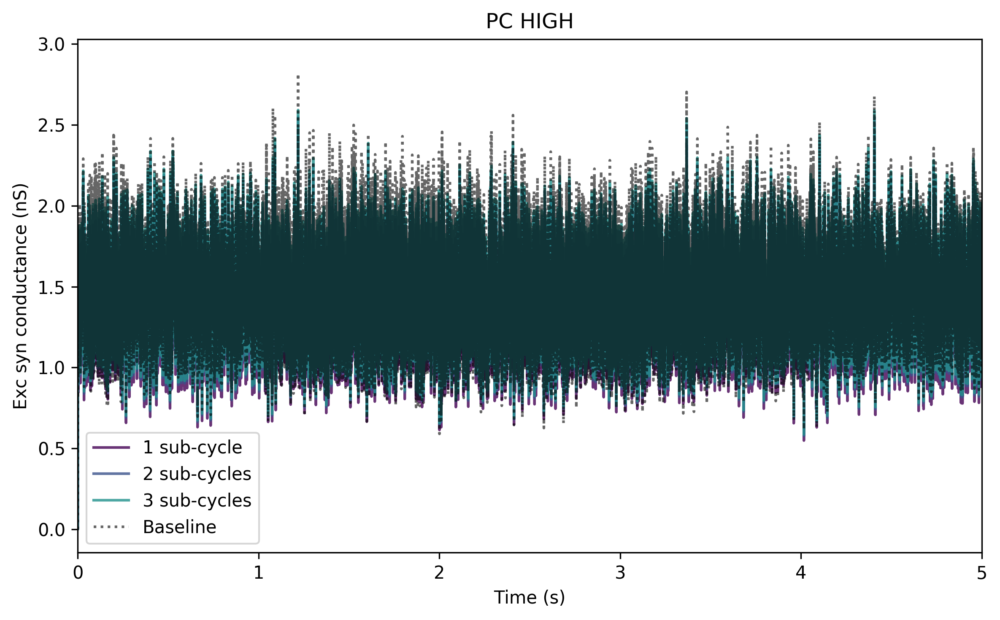

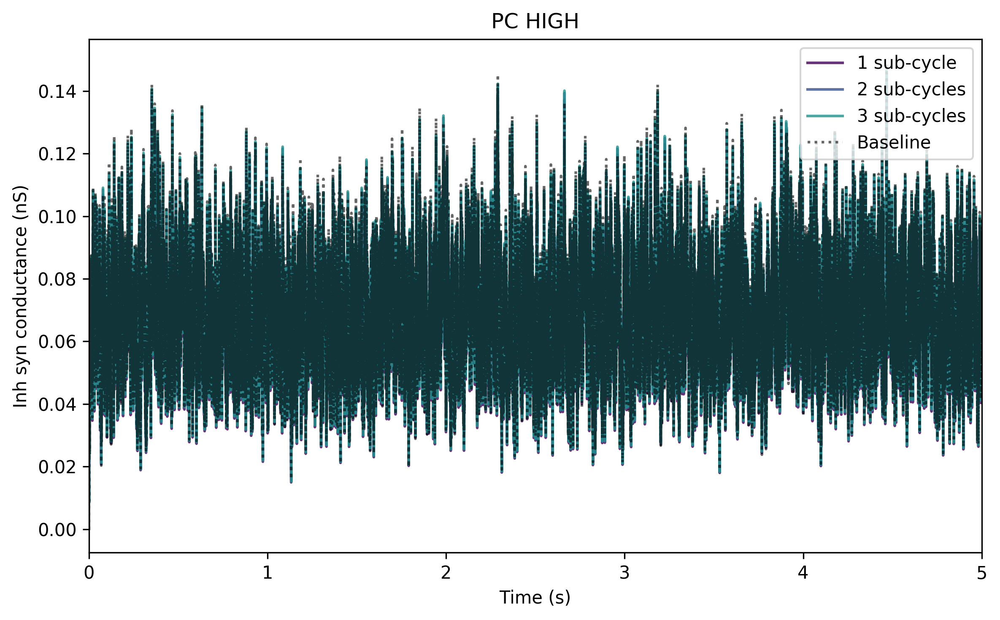

In [907]:
plot_assortment('purkinje', subcycles=[1,2,3], case=0, xlim=[0, 5])
plot_assortment('purkinje', subcycles=[1,2,3], case=1, xlim=[0, 5])


# plot_assortment('aa_pc', subcycles=[1,2,3], case=0, xlim=[0, .1])
# plot_assortment('aa_pc', subcycles=[1,2,3], case=1, xlim=[0, .1])
# plot_assortment('aa_pc', subcycles=[1,2,3], case=2, xlim=[0, .1])

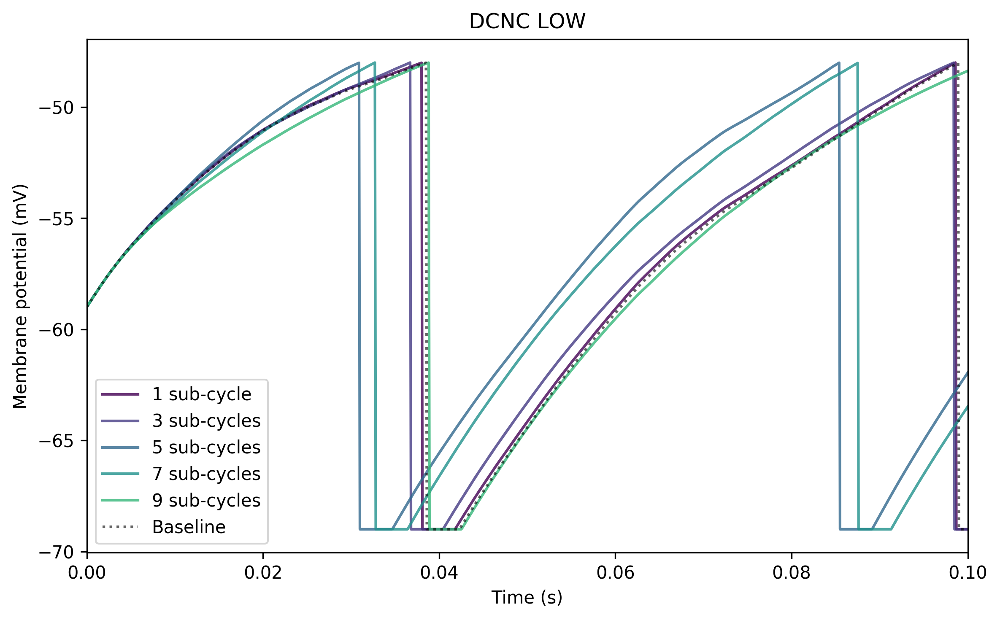

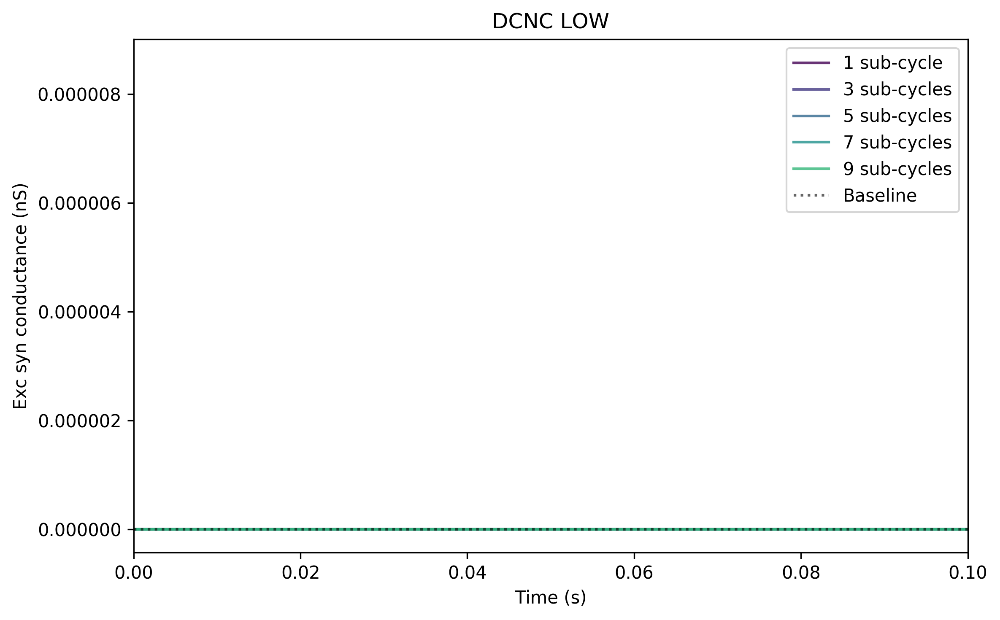

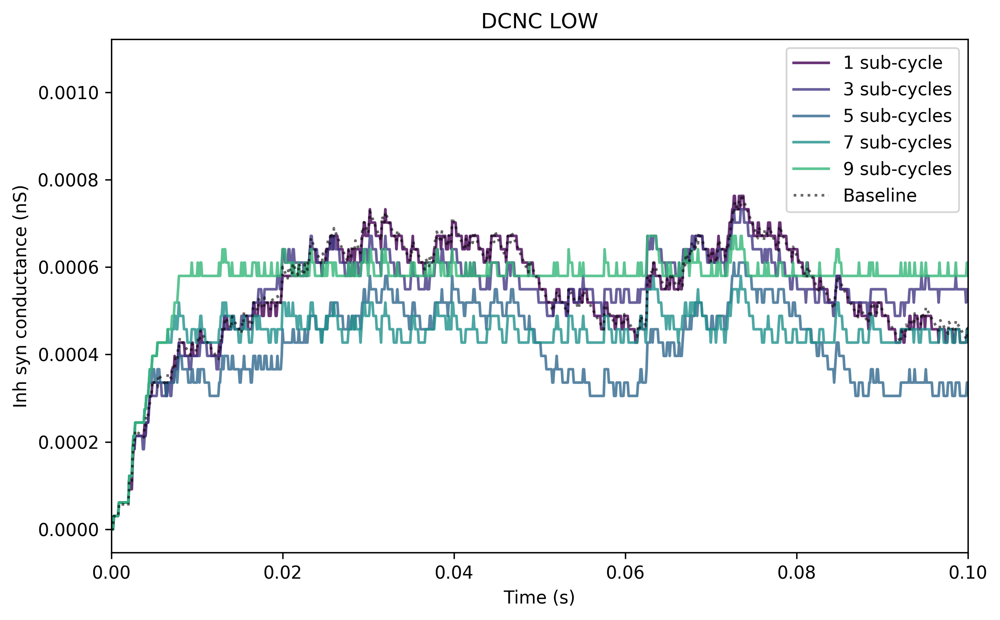

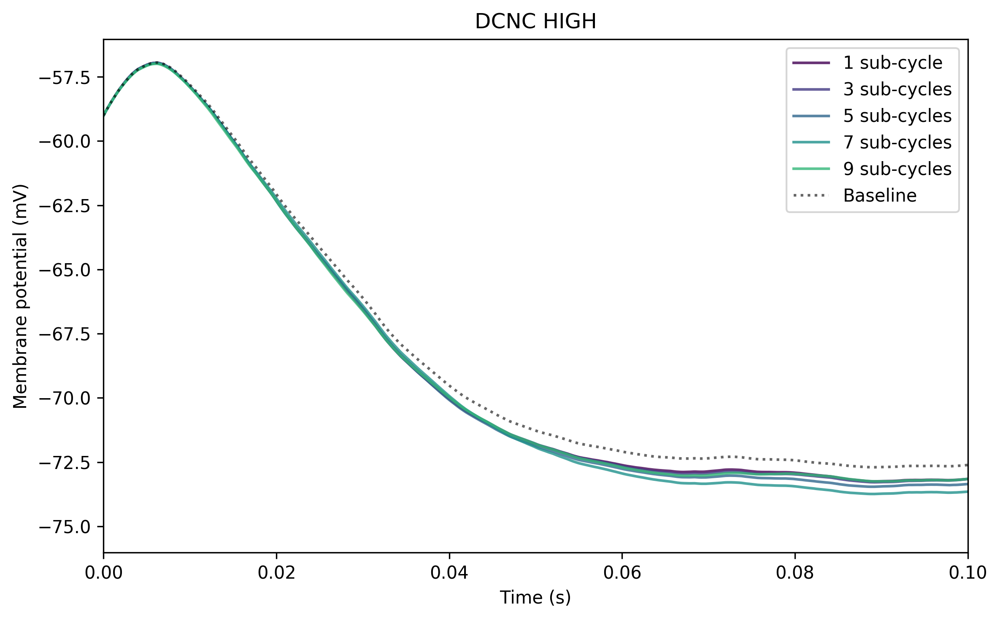

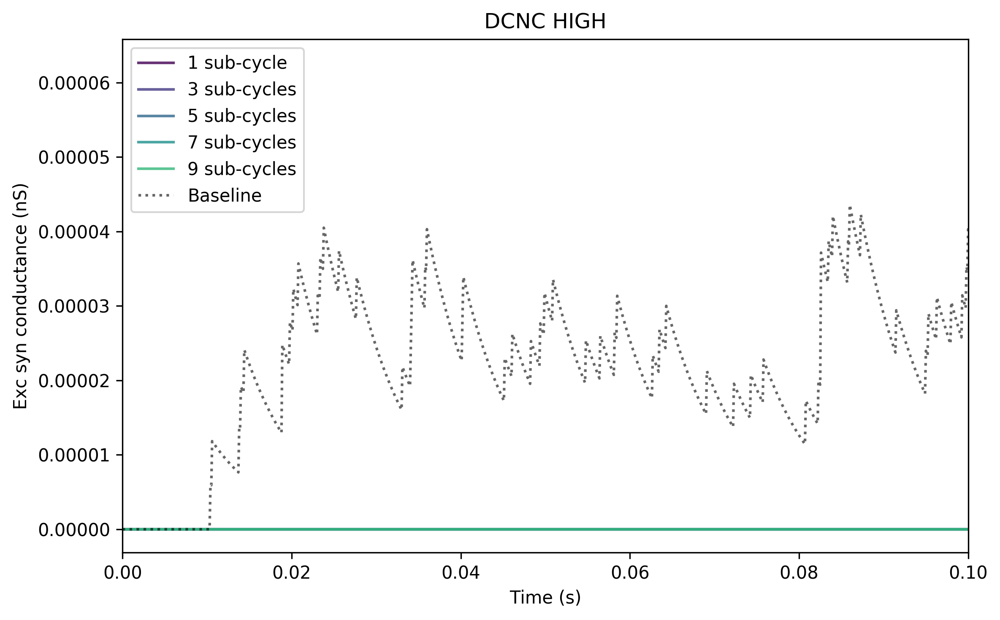

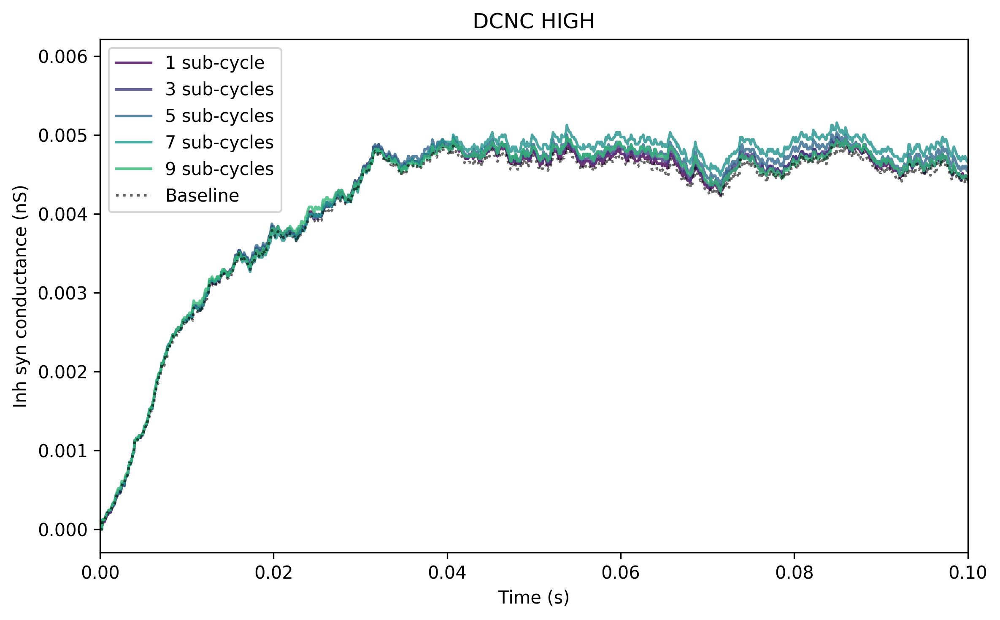

In [908]:
plot_assortment('dcn', subcycles=np.arange(1, 10)[::2], case=0, xlim=[0, .1])
plot_assortment('dcn', subcycles=np.arange(1, 10)[::2], case=1, xlim=[0, .1])

# Did any of these simulations on SpiNNaker see saturations?

Tests with representative fan-ins and average firing rates recorded from the large scale model do not saturate. The experiment with "simplified" structure does see significant number of saturations.

# Single spike plots

Plotting                                :single_vs_max_spikes.png               
Plotting                                :single_vs_max_spikes.pdf               


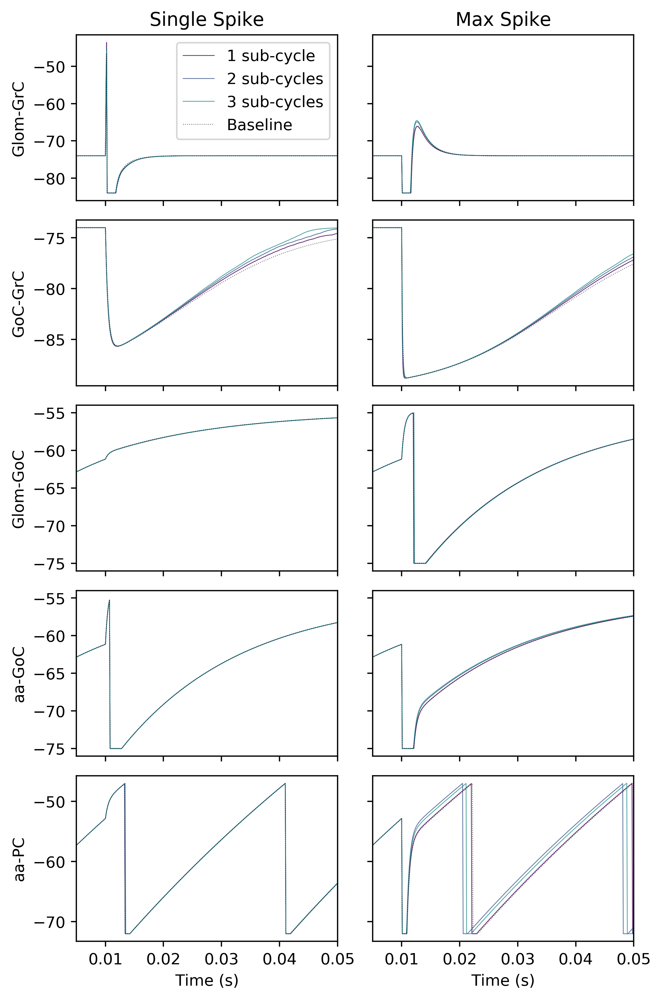

In [935]:
desired_plots = ['glom_grc', 'goc_grc', 'glom_goc', 'aa_goc', 'aa_pc']
plot_by_case(vs, baseline_vs, desired_plots, [1,2,3], cases=[0, 1], y_label="mV", xlim=[.005, .05])

Plotting                                :single_vs_max_spikes.png               
Plotting                                :single_vs_max_spikes.pdf               


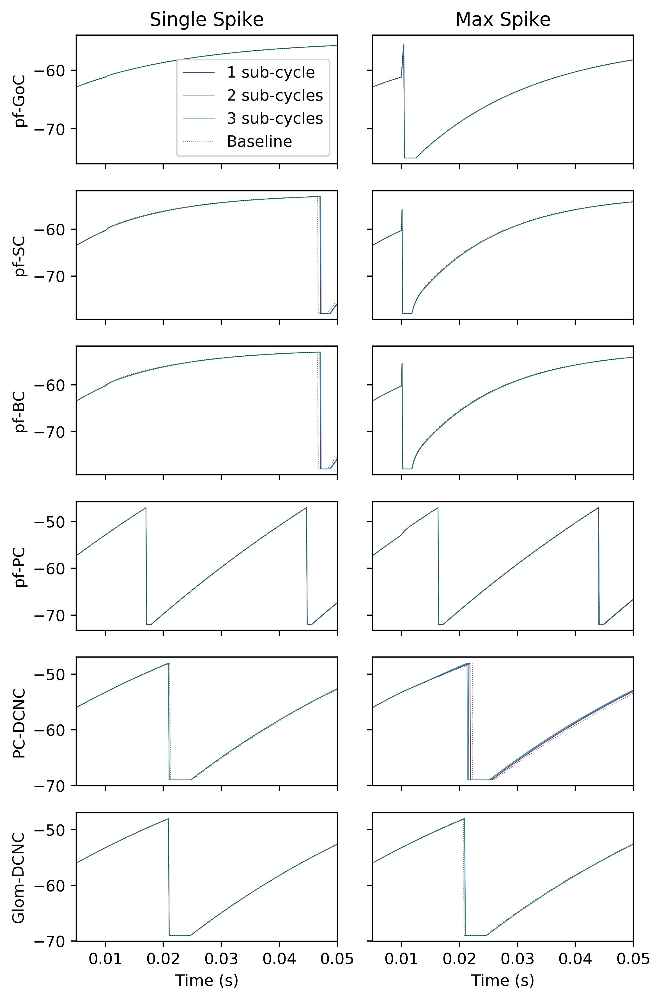

In [936]:
desired_plots = ['pf_goc', 'pf_sc', 'pf_bc', 'pf_pc', 'pc_dcn', 'glom_dcn']
plot_by_case(vs, baseline_vs, desired_plots, [1,2,3], cases=[0, 1], y_label="mV", xlim=[.005, .05])

# Look at conductance values

Want to get some representative plots for some of the neurons. GrC misbehave at 1 sub-cycle, so that + further subcycles to show the improvement. 

In [ ]:
# def produce_statistics_table(signal, baseline_signal, subcycles):
    signal_length = len()
    

In [823]:
signal = gsyn_excs
baseline_signal = baseline_gsyn_excs

In [825]:

for pop in plot_order:
    print("POP", pop)
    for sc in [1, 2, 4, 6]:
        for case in cases:
            signal_slice = signal[sc][case][pop][0][1000:]
            baseline_signal_slice = baseline_signal[sc][case][pop][0][1000:]
            print("\tSub-cycles", sc, "Case", case_names[case], "SpiNNaker", np.mean(signal_slice), "NEST", np.mean(baseline_signal_slice), "|", scipy.stats.ttest_ind(signal_slice, baseline_signal_slice))
            print("\tmax_gsyn", np.max(baseline_signal_slice))
    print("-" * 80)

POP granule
	Sub-cycles 1 Case LOW SpiNNaker 1.5239060527146464e-05 NEST 1.705130463663558e-05 | Ttest_indResult(statistic=-1.459066009650591, pvalue=0.1445485267881513)
	max_gsyn 0.009000055297697387
	Sub-cycles 1 Case HIGH SpiNNaker 0.002507171014342645 NEST 0.002782340100405275 | Ttest_indResult(statistic=-17.331354599963667, pvalue=3.059428305766652e-67)
	max_gsyn 0.03171838017339508
	Sub-cycles 2 Case LOW SpiNNaker 1.6014638573232323e-05 NEST 1.705130463663558e-05 | Ttest_indResult(statistic=-0.8159505599174883, pvalue=0.4145293946757381)
	max_gsyn 0.009000055297697387
	Sub-cycles 2 Case HIGH SpiNNaker 0.002631696296460701 NEST 0.002782340100405275 | Ttest_indResult(statistic=-9.276842044090035, pvalue=1.762538014347769e-20)
	max_gsyn 0.03171838017339508
	Sub-cycles 4 Case LOW SpiNNaker 1.6370985243055554e-05 NEST 1.705130463663558e-05 | Ttest_indResult(statistic=-0.5295373814131968, pvalue=0.5964333136731208)
	max_gsyn 0.009000055297697387
	Sub-cycles 4 Case HIGH SpiNNaker 0.0026

In [819]:
def report_best_values(diff_map, plot_order, cases, subcycles):
    n_pops = len(plot_order)
    n_sc = len(subcycles)
    n_cases = len(cases)
    for pop_id, pop in enumerate(plot_order):
        curr_pop_diff_slice = diff_map[pop_id*n_sc:(pop_id+1)*n_sc]
        assert curr_pop_diff_slice.shape[0] == n_sc
        assert curr_pop_diff_slice.shape[1] == n_cases
        print("For POP", pop)
        for cid, case in enumerate(cases):
            case_slice = curr_pop_diff_slice[:, cid]
            best_for_case = np.argmin(np.abs(case_slice))
            print("the best for case", case,  "is", case_slice[best_for_case], "achieved for sc", subcycles[best_for_case])
            

In [820]:
report_best_values(spike_lead_lag_map_10th, plot_order, cases, subcycles)

For POP granule
the best for case 0 is -1786.0 achieved for sc 2
the best for case 1 is nan achieved for sc 1
For POP golgi
the best for case 0 is -0.10000000000000142 achieved for sc 8
the best for case 1 is -0.09999999999999787 achieved for sc 1
For POP stellate
the best for case 0 is nan achieved for sc 1
the best for case 1 is -15.700000000000003 achieved for sc 2
For POP basket
the best for case 0 is 0.0 achieved for sc 1
the best for case 1 is -42.400000000000034 achieved for sc 1
For POP purkinje
the best for case 0 is -0.20000000000000284 achieved for sc 1
the best for case 1 is -0.29999999999999893 achieved for sc 1
For POP dcn
the best for case 0 is -41.0 achieved for sc 1
the best for case 1 is 0.0 achieved for sc 1


In [821]:
report_best_values(spike_lead_lag_map_100th, plot_order, cases, subcycles)

For POP granule
the best for case 0 is nan achieved for sc 1
the best for case 1 is nan achieved for sc 1
For POP golgi
the best for case 0 is -2.0 achieved for sc 8
the best for case 1 is -0.19999999999998863 achieved for sc 1
For POP stellate
the best for case 0 is nan achieved for sc 1
the best for case 1 is -569.5999999999999 achieved for sc 6
For POP basket
the best for case 0 is 0.0 achieved for sc 1
the best for case 1 is -1361.4 achieved for sc 4
For POP purkinje
the best for case 0 is -0.09999999999990905 achieved for sc 1
the best for case 1 is -2.299999999999997 achieved for sc 1
For POP dcn
the best for case 0 is -540.0 achieved for sc 1
the best for case 1 is 0.0 achieved for sc 1


In [822]:
report_best_values(diff_map, plot_order, cases, subcycles)

For POP granule
the best for case 0 is 6.0 achieved for sc 2
the best for case 1 is 4.0 achieved for sc 3
For POP golgi
the best for case 0 is 20.0 achieved for sc 8
the best for case 1 is 14.0 achieved for sc 1
For POP stellate
the best for case 0 is 0.0 achieved for sc 1
the best for case 1 is 338.0 achieved for sc 6
For POP basket
the best for case 0 is -2.0 achieved for sc 1
the best for case 1 is 208.0 achieved for sc 6
For POP purkinje
the best for case 0 is 0.0 achieved for sc 1
the best for case 1 is 470.0 achieved for sc 1
For POP dcn
the best for case 0 is 30.0 achieved for sc 1
the best for case 1 is 0.0 achieved for sc 1
